In [1]:
!pip install ultralytics -q
!pip install tensorflow -q
!pip install matplotlib -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 17.5 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 94.8 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 70.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 40.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 29.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 12.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 76.4 MB/s eta 0:00:00:00:0100:01


In [3]:
import os
import random
import yaml
from ultralytics import YOLO
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import torch
from PIL import Image, ImageDraw, ImageFont
from torchvision.ops import nms

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


E0000 00:00:1752821656.605841      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1752821656.668809      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [4]:
dataset_dir = '/kaggle/input/potholes-detection-yolov8'
train_images = os.path.join(dataset_dir, 'train', 'images')
train_labels = os.path.join(dataset_dir, 'train', 'labels')
val_images   = os.path.join(dataset_dir, 'valid', 'images')
val_labels   = os.path.join(dataset_dir, 'valid', 'labels')
test_images  = os.path.join(dataset_dir, 'test', 'images')

In [5]:
data_yaml = {
    'path': dataset_dir,
    'train': 'train/images',
    'val':   'valid/images',
    'test':  'test/images',
    'nc': 1,
    'names': ['Potholes']
}
# Save YAML
yaml_path = 'potholes.yaml'
with open(yaml_path, 'w') as f:
    yaml.dump(data_yaml, f)


In [6]:
model = YOLO('yolov8m.pt')

100%|██████████| 49.7M/49.7M [00:00<00:00, 244MB/s]


In [7]:
results = model.train(
    data=yaml_path,
    epochs=60,
    imgsz=512,
    batch=32,
    device=0,            
    project='runs/train',
    name='pothole_yolov8m',
    exist_ok=True
)

Ultralytics 8.3.167 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=potholes.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=60, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=pothole_yolov8m, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrai

100%|██████████| 755k/755k [00:00<00:00, 18.0MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 74.7MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 29.2±16.9 MB/s, size: 303.2 KB)


train: Scanning /kaggle/input/potholes-detection-yolov8/train/labels... 1572 images, 0 backgrounds, 9 corrupt: 100%|██████████| 1581/1581 [00:07<00:00, 201.48it/s]

train: /kaggle/input/potholes-detection-yolov8/train/images/pothole_114.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/potholes-detection-yolov8/train/images/pothole_114.jpg'
train: /kaggle/input/potholes-detection-yolov8/train/images/pothole_140.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/potholes-detection-yolov8/train/images/pothole_140.jpg'
train: /kaggle/input/potholes-detection-yolov8/train/images/pothole_1888.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/potholes-detection-yolov8/train/images/pothole_1888.jpg'
train: /kaggle/input/potholes-detection-yolov8/train/images/pothole_352.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/potholes-detection-yolov8/train/images/pothole_352.jpg'
train: /kaggle/input/potholes-detection-yolov8/train/images/pothole_379.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/

WARNING ⚠️ train: Cache directory /kaggle/input/potholes-detection-yolov8/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 31.8±25.1 MB/s, size: 163.3 KB)


val: Scanning /kaggle/input/potholes-detection-yolov8/valid/labels... 394 images, 0 backgrounds, 2 corrupt: 100%|██████████| 396/396 [00:02<00:00, 163.81it/s]

val: /kaggle/input/potholes-detection-yolov8/valid/images/pothole_1870.jpg: ignoring corrupt image/label: invalid image format GIF. Supported formats are:
images: {'bmp', 'tiff', 'png', 'mpo', 'heic', 'jpeg', 'tif', 'webp', 'dng', 'jpg', 'pfm'}
videos: {'mpg', 'asf', 'm4v', 'gif', 'mkv', 'avi', 'mp4', 'ts', 'webm', 'wmv', 'mpeg', 'mov'}
val: /kaggle/input/potholes-detection-yolov8/valid/images/pothole_975.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/potholes-detection-yolov8/valid/images/pothole_975.jpg'
WARNING ⚠️ val: Cache directory /kaggle/input/potholes-detection-yolov8/valid is not writeable, cache not saved.


Plotting labels to runs/train/pothole_yolov8m/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 512 train, 512 val
Using 4 dataloader workers
Logging results to runs/train/pothole_yolov8m
Starting training for 60 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/60      11.2G      1.564      1.873      1.435         14        512: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.43it/s]

                   all        394       1393     0.0575      0.295      0.034     0.0137



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/60      11.5G      1.602      1.499      1.445         43        512: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.73it/s]

                   all        394       1393      0.194      0.337      0.114     0.0479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/60      11.6G      1.627      1.452      1.451         44        512: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.76it/s]


                   all        394       1393      0.463      0.268      0.258       0.12

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/60      11.6G      1.638      1.493      1.463         14        512: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.78it/s]


                   all        394       1393      0.347      0.406      0.271      0.117

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/60      11.6G      1.582      1.436      1.453         34        512: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.78it/s]


                   all        394       1393      0.558      0.452      0.458      0.238

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/60      11.3G      1.534      1.371      1.408          9        512: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.83it/s]


                   all        394       1393      0.476       0.41      0.405      0.219

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/60      11.4G      1.495      1.295      1.383         13        512: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.74it/s]


                   all        394       1393       0.55      0.528      0.514      0.288

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/60      11.6G      1.456      1.247      1.367         32        512: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.79it/s]

                   all        394       1393      0.567      0.518      0.511      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/60      11.6G      1.447      1.217      1.352         25        512: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.83it/s]

                   all        394       1393      0.633      0.557      0.602      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/60      11.6G      1.407      1.168       1.34         23        512: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.77it/s]

                   all        394       1393      0.644      0.526      0.591       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/60      11.6G      1.399      1.157      1.325         30        512: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.80it/s]


                   all        394       1393      0.732      0.575       0.66      0.402

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/60      11.3G      1.375      1.131      1.311         25        512: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.72it/s]


                   all        394       1393        0.7      0.589      0.669      0.394

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/60      11.6G      1.341      1.085      1.281         30        512: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.77it/s]

                   all        394       1393       0.64      0.581      0.625      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/60      11.6G      1.318      1.078       1.28         17        512: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.79it/s]


                   all        394       1393      0.739      0.635      0.706      0.427

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/60      11.7G      1.322      1.062      1.266         32        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.81it/s]

                   all        394       1393       0.73      0.611      0.687      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/60      11.6G      1.307      1.036       1.26         40        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.83it/s]

                   all        394       1393      0.697      0.641      0.696      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/60      11.6G      1.315       1.03      1.265         22        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.84it/s]

                   all        394       1393      0.708      0.642      0.703      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/60      11.6G      1.291      1.023      1.256         34        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.83it/s]

                   all        394       1393      0.723      0.619      0.692      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/60      11.6G      1.276      1.002      1.251         20        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.79it/s]

                   all        394       1393      0.721       0.65      0.717      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/60      11.7G      1.259     0.9701      1.231         29        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.83it/s]

                   all        394       1393      0.732      0.665      0.724      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/60      11.6G      1.261     0.9929      1.241         34        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.83it/s]

                   all        394       1393      0.705       0.64      0.703       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/60      11.6G      1.237     0.9606      1.223         25        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.82it/s]

                   all        394       1393      0.766       0.63      0.723      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/60      11.6G      1.216      0.925      1.217         19        512: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.83it/s]

                   all        394       1393      0.739      0.651      0.719      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/60      11.6G      1.202     0.9125      1.196         19        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.79it/s]

                   all        394       1393      0.705       0.64      0.708      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/60      11.6G      1.211     0.9009      1.211         30        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.78it/s]

                   all        394       1393      0.728      0.669       0.73      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/60      11.6G      1.203      0.944       1.22         10        512: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.78it/s]

                   all        394       1393      0.778      0.609       0.72      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/60      11.7G      1.203     0.9038      1.197         50        512: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.85it/s]

                   all        394       1393      0.748      0.658       0.74      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/60      11.6G      1.186     0.8944      1.197         62        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.84it/s]

                   all        394       1393      0.758      0.667      0.744       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/60      11.6G      1.162     0.8641       1.18         28        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.82it/s]

                   all        394       1393      0.774      0.654      0.739      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/60      11.6G       1.17     0.8608      1.192         28        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.87it/s]

                   all        394       1393      0.743      0.693      0.737      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/60      11.3G       1.16     0.8557      1.169         25        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.77it/s]

                   all        394       1393      0.725      0.693      0.746      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/60      11.6G      1.133     0.8299      1.165         16        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.87it/s]

                   all        394       1393      0.753      0.686      0.756      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/60      11.6G       1.14     0.8391      1.172          6        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.76it/s]

                   all        394       1393      0.754       0.69       0.75       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/60      11.6G      1.155     0.8456      1.173         31        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.85it/s]

                   all        394       1393      0.782       0.66      0.761      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/60      11.6G      1.127     0.8075      1.169         34        512: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.81it/s]

                   all        394       1393      0.769      0.677      0.762      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/60      11.6G      1.105     0.7954      1.148         27        512: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.78it/s]

                   all        394       1393      0.792      0.651      0.745      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/60      11.6G       1.11     0.7924      1.154         26        512: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.82it/s]

                   all        394       1393      0.793      0.665      0.756       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/60      11.6G      1.108     0.7987      1.147         23        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.87it/s]

                   all        394       1393      0.797      0.682      0.768      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/60      11.3G      1.094     0.7748      1.139         34        512: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.81it/s]

                   all        394       1393      0.755      0.714      0.772      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/60      11.6G      1.093     0.7706      1.139         19        512: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.73it/s]

                   all        394       1393      0.778      0.682      0.763      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/60      11.6G      1.079      0.757      1.144         21        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.85it/s]

                   all        394       1393      0.749      0.725       0.77      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/60      11.7G      1.086     0.7685      1.135         13        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.83it/s]

                   all        394       1393      0.779      0.701      0.786      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/60      11.7G      1.075     0.7516      1.136         20        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.85it/s]

                   all        394       1393       0.77      0.709      0.781      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/60      11.3G      1.059     0.7383      1.125         21        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.82it/s]

                   all        394       1393      0.827      0.656      0.781      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/60      11.3G      1.049     0.7217      1.117         35        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.83it/s]

                   all        394       1393      0.789      0.709      0.779       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/60      11.3G       1.03     0.7099      1.111         29        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.86it/s]

                   all        394       1393      0.773      0.709       0.78      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/60      11.6G      1.033      0.714      1.115         14        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.75it/s]

                   all        394       1393      0.782      0.715      0.785      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/60      11.6G      1.027     0.6946      1.103         64        512: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.80it/s]

                   all        394       1393      0.788      0.709      0.785      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/60      11.6G      1.004     0.6864      1.098         18        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.87it/s]

                   all        394       1393       0.79      0.712      0.791       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/60      11.6G      1.012     0.6772      1.098         28        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.89it/s]

                   all        394       1393      0.767       0.72      0.773      0.521


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/60      11.6G     0.9735     0.6582      1.057         13        512: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.78it/s]

                   all        394       1393      0.783      0.706      0.777      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/60      11.6G     0.9533     0.6163       1.05         14        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.81it/s]

                   all        394       1393      0.814      0.698       0.78      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/60      11.6G     0.9412     0.6013      1.042          4        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.84it/s]

                   all        394       1393      0.788      0.715      0.787      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/60      11.6G     0.9263      0.596      1.041          5        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.81it/s]

                   all        394       1393      0.823      0.707      0.789      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/60      11.6G     0.9225     0.5785      1.029         12        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.83it/s]

                   all        394       1393      0.802      0.719       0.79      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/60      11.6G     0.9178     0.5759      1.021         25        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.81it/s]

                   all        394       1393      0.775      0.737      0.791      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/60      11.6G     0.9221     0.5668      1.039          4        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.77it/s]

                   all        394       1393      0.792      0.728      0.789      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/60      11.4G     0.9089     0.5624      1.027         19        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.87it/s]

                   all        394       1393      0.818      0.697      0.788      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/60      11.6G     0.8814      0.534      1.004         13        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.73it/s]

                   all        394       1393      0.813      0.704      0.791      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/60      11.6G     0.8685     0.5359      1.006         11        512: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.83it/s]

                   all        394       1393      0.791      0.718      0.787      0.533



60 epochs completed in 0.843 hours.
Optimizer stripped from runs/train/pothole_yolov8m/weights/last.pt, 52.0MB
Optimizer stripped from runs/train/pothole_yolov8m/weights/best.pt, 52.0MB

Validating runs/train/pothole_yolov8m/weights/best.pt...
Ultralytics 8.3.167 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 92 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.26it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        394       1393      0.814      0.704      0.791      0.535
Speed: 0.1ms preprocess, 5.8ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/train/pothole_yolov8m


In [8]:
import matplotlib.image as mpimg

# Cargar la imagen
image = mpimg.imread("./runs/detect/val/confusion_matrix.png")
image_1 = mpimg.imread("./runs/detect/val/P_curve.png")

# Mostrar la matriz de confusión imagen
fig, axis = plt.subplots(1,2,figsize=(18,8))
axis[0].imshow(image)
axis[0].axis('off')
axis[1].imshow(image_1)
axis[1].axis('off')
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: './runs/detect/val/confusion_matrix.png'


image 1/1 /kaggle/input/pothole-image-dataset/Pothole_Image_Data/417.jpg: 288x512 1 Potholes, 51.6ms
Speed: 1.5ms preprocess, 51.6ms inference, 1.7ms postprocess per image at shape (1, 3, 288, 512)


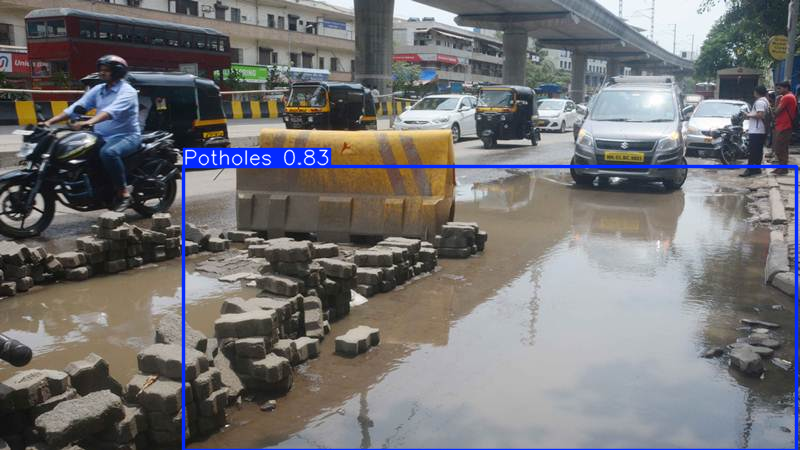


image 1/1 /kaggle/input/pothole-image-dataset/Pothole_Image_Data/205.jpg: 512x384 6 Potholess, 47.6ms
Speed: 2.1ms preprocess, 47.6ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 384)


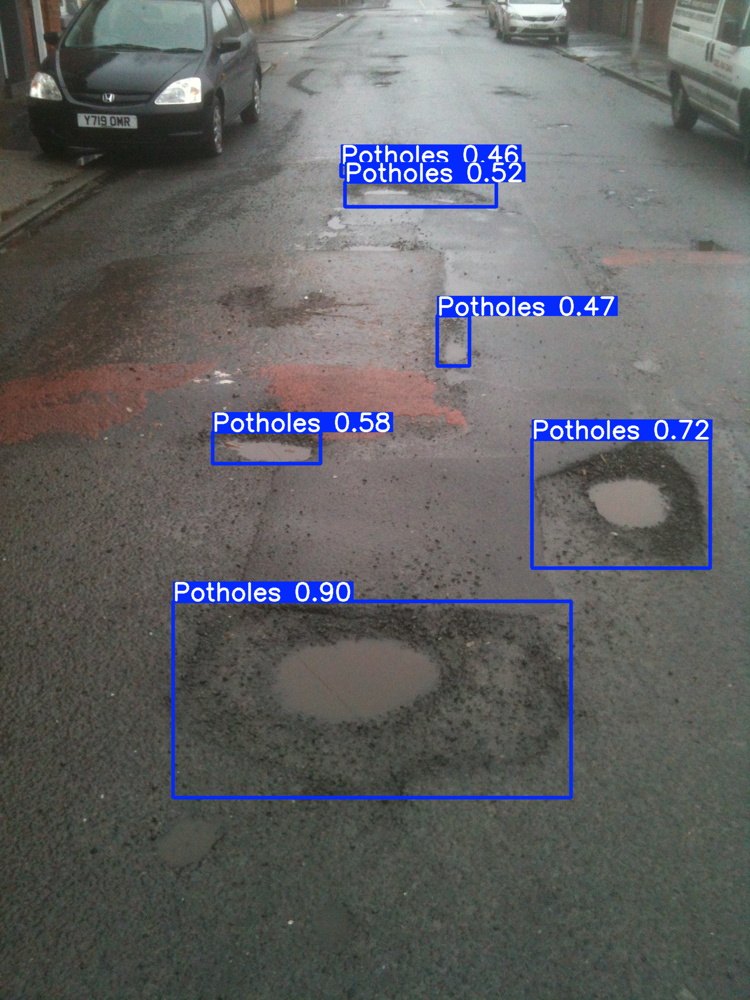


image 1/1 /kaggle/input/pothole-image-dataset/Pothole_Image_Data/314.jpg: 384x512 17 Potholess, 50.9ms
Speed: 2.1ms preprocess, 50.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 512)



image 1/1 /kaggle/input/pothole-image-dataset/Pothole_Image_Data/608.jpg: 384x512 1 Potholes, 14.4ms
Speed: 2.8ms preprocess, 14.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 512)


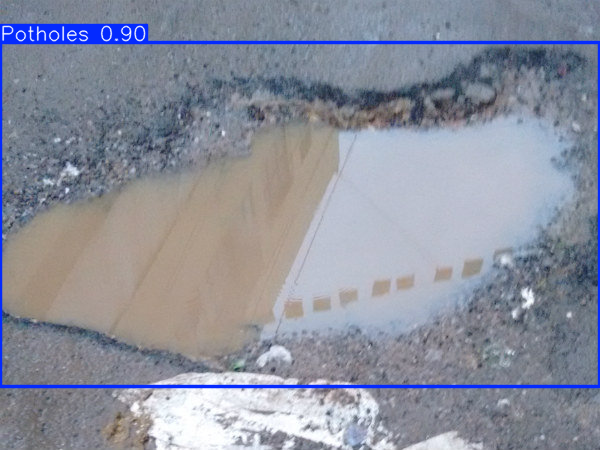


image 1/1 /kaggle/input/pothole-image-dataset/Pothole_Image_Data/248.jpg: 512x384 3 Potholess, 14.5ms
Speed: 1.7ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 384)


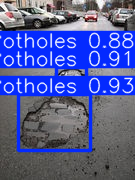

In [9]:
# Run inference on random images from another dataset
secondary_dir = '/kaggle/input/pothole-image-dataset/Pothole_Image_Data'  
sec_images = [os.path.join(secondary_dir, f) for f in os.listdir(secondary_dir) if f.endswith('.jpg') or f.endswith('.png')]
random_samples = random.sample(sec_images, 5)
for img_path in random_samples:
    results = model.predict(img_path, imgsz=512, conf=0.4)
    result = results[0]            # grab the single Results object
    result.show()                  # now this works

In [10]:
# Exportar el modelo a TorchScript
export_dir = 'runs/export'
tsj_path = model.export(format='torchscript', project=export_dir, name='pothole_ts')[0]
print(f"TorchScript model saved to: {tsj_path}")

Ultralytics 8.3.167 🚀 Python-3.11.13 torch-2.6.0+cu124 CPU (Intel Xeon 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/

PyTorch: starting from 'runs/train/pothole_yolov8m/weights/best.pt' with input shape (1, 3, 512, 512) BCHW and output shape(s) (1, 5, 5376) (49.6 MB)

TorchScript: starting export with torch 2.6.0+cu124...
TorchScript: export success ✅ 4.3s, saved as 'runs/train/pothole_yolov8m/weights/best.torchscript' (99.1 MB)

Export complete (5.4s)
Results saved to /kaggle/working/runs/train/pothole_yolov8m/weights
Predict:         yolo predict task=detect model=runs/train/pothole_yolov8m/weights/best.torchscript imgsz=512  
Validate:        yolo val task=detect model=runs/train/pothole_yolov8m/weights/best.torchscript imgsz=512 data=potholes.yaml  
Visualize:       https://netron.app
TorchScript model saved to: r


In [11]:
# Parámetros
ts_model_path = '/kaggle/working/runs/train/pothole_yolov8m/weights/best.torchscript'
secondary_dir = '/kaggle/input/pothole-image-dataset/Pothole_Image_Data'
conf_thresh   = 0.4    # umbral de confianza
iou_thresh    = 0.5     # umbral de NMS

# Carga modelo TorchScript
ts_model = torch.jit.load(ts_model_path).eval()
font     = ImageFont.load_default()

# Lista de imágenes
all_imgs = [
    os.path.join(secondary_dir, f)
    for f in os.listdir(secondary_dir)
    if f.lower().endswith(('.jpg','.png'))
]
random_samples = random.sample(all_imgs, 5)

for img_path in random_samples:
    # --- Preprocesado ---
    orig        = Image.open(img_path).convert('RGB')
    img_resized = orig.resize((640,640))
    arr         = np.array(img_resized, dtype=np.float32)/255.0
    inp         = torch.from_numpy(arr).permute(2,0,1).unsqueeze(0)

    # --- Inferencia ---
    with torch.no_grad():
        preds = ts_model(inp)               # [1,5,8400]
    dets = preds[0].permute(1,0).cpu()      # (8400,5) Tensor

    # --- Filtrar por score ---
    dets = dets[dets[:,4] > conf_thresh]   # conservamos filas con conf > umbral
    if dets.numel() == 0:
        continue

    # --- Convertir (xc,yc,w,h) → (x1,y1,x2,y2) ---
    xcs, ycs, ws, hs, confs = dets.t()
    x1 = xcs - ws/2;  y1 = ycs - hs/2
    x2 = xcs + ws/2;  y2 = ycs + hs/2

    # Cajas y scores para NMS
    boxes  = torch.stack([x1, y1, x2, y2], dim=1)   # (N,4)
    scores = confs                                    # (N,)

    # --- Aplicar NMS ---
    keep_idx = nms(boxes, scores, iou_thresh)        # índices tras NMS

    # --- Dibujo de cajas finales ---
    draw = ImageDraw.Draw(img_resized)
    for idx in keep_idx:
        bx = boxes[idx].cpu().numpy().tolist()
        sc = scores[idx].item()
        draw.rectangle(bx, outline='red', width=2)
        draw.text((bx[0], bx[1]-10), f"{sc:.2f}", fill='yellow', font=font)

    # --- Mostrar resultado ---
    plt.figure(figsize=(8,6))
    plt.imshow(img_resized)
    plt.axis('off')
    plt.title(f"Potholes en {os.path.basename(img_path)} (post-NMS)")
    plt.show()

RuntimeError: The following operation failed in the TorchScript interpreter.
Traceback of TorchScript, serialized code (most recent call last):
  File "code/__torch__/ultralytics/nn/tasks.py", line 74, in forward
    _35 = (_18).forward(act, _34, )
    _36 = (_20).forward((_19).forward(act, _35, ), _29, )
    _37 = (_22).forward(_33, _35, (_21).forward(act, _36, ), )
           ~~~~~~~~~~~~ <--- HERE
    return _37
  File "code/__torch__/ultralytics/nn/modules/head.py", line 45, in forward
    anchor_points = torch.unsqueeze(CONSTANTS.c0, 0)
    lt, rb, = torch.chunk(_13, 2, 1)
    x1y1 = torch.sub(anchor_points, lt)
           ~~~~~~~~~ <--- HERE
    x2y2 = torch.add(anchor_points, rb)
    c_xy = torch.div(torch.add(x1y1, x2y2), CONSTANTS.c1)

Traceback of TorchScript, original code (most recent call last):
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/tal.py(385): dist2bbox
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/head.py(202): decode_bboxes
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/head.py(182): _inference
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/modules/head.py(123): forward
/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py(1729): _slow_forward
/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py(1750): _call_impl
/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py(1739): _wrapped_call_impl
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/tasks.py(180): _predict_once
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/tasks.py(157): predict
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/tasks.py(139): forward
/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py(1729): _slow_forward
/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py(1750): _call_impl
/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py(1739): _wrapped_call_impl
/usr/local/lib/python3.11/dist-packages/torch/jit/_trace.py(1276): trace_module
/usr/local/lib/python3.11/dist-packages/torch/jit/_trace.py(696): _trace_impl
/usr/local/lib/python3.11/dist-packages/torch/jit/_trace.py(1000): trace
/usr/local/lib/python3.11/dist-packages/ultralytics/engine/exporter.py(568): export_torchscript
/usr/local/lib/python3.11/dist-packages/ultralytics/engine/exporter.py(193): outer_func
/usr/local/lib/python3.11/dist-packages/ultralytics/engine/exporter.py(483): __call__
/usr/local/lib/python3.11/dist-packages/ultralytics/engine/model.py(734): export
/tmp/ipykernel_36/3276171169.py(3): <cell line: 0>
/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py(3553): run_code
/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py(3473): run_ast_nodes
/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py(3257): run_cell_async
/usr/local/lib/python3.11/dist-packages/IPython/core/async_helpers.py(78): _pseudo_sync_runner
/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py(3030): _run_cell
/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py(2975): run_cell
/usr/local/lib/python3.11/dist-packages/ipykernel/zmqshell.py(528): run_cell
/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py(383): do_execute
/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py(730): execute_request
/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py(406): dispatch_shell
/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py(499): process_one
/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py(510): dispatch_queue
/usr/lib/python3.11/asyncio/events.py(84): _run
/usr/lib/python3.11/asyncio/base_events.py(1936): _run_once
/usr/lib/python3.11/asyncio/base_events.py(608): run_forever
/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py(211): start
/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py(712): start
/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py(992): launch_instance
/usr/local/lib/python3.11/dist-packages/colab_kernel_launcher.py(37): <module>
<frozen runpy>(88): _run_code
<frozen runpy>(198): _run_module_as_main
RuntimeError: The size of tensor a (5376) must match the size of tensor b (8400) at non-singleton dimension 2
